# Stable Diffusion for visually explaining classification results



In [1]:
# !pip install -q --upgrade transformers diffusers ftfy

In [2]:
# from huggingface_hub import notebook_login
# notebook_login()

In [3]:
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler
from tqdm.auto import tqdm
from torch import autocast
from PIL import Image
from matplotlib import pyplot as plt
import numpy
from torchvision import transforms as tfms

# For video display:
from IPython.display import HTML
from base64 import b64encode

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

In [5]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [29]:

# For each of the images, visually explain why the model thinks it is in the first class and not the second class.
imgs = {
        'rat.jpg' : ('https://i.pinimg.com/564x/6d/aa/0f/6daa0f545d4e6a5c4f7f7889684a108f.jpg', ('rat', 'mouse')),
        # 'shark.jpg' : ('https://i.pinimg.com/564x/1c/86/7a/1c867ac54f8b26e105a1c5fd803f4f81.jpg', ('shark', 'dolphin')),
        'zebra.jpg' : ('https://i.pinimg.com/564x/dc/d2/dd/dcd2dd98acc1d28bd6c09ec870ddc34d.jpg', ('zebra', 'horse')),
        'car.jpg' : ('https://i.pinimg.com/564x/8f/01/a5/8f01a54dfd8dca0d4689e265a9449feb.jpg', ('sports car', 'taxi')),
        'rabbit.jpg' : ('https://i.pinimg.com/564x/9f/e2/d5/9fe2d5aa0fa6cef534e1cde99a694853.jpg', ('rabbit', 'hare')),
        # 'fork.jpg' : ('https://i.pinimg.com/564x/70/ae/f8/70aef82459d1623d6affd6c3f3bb4a14.jpg'('fork', 'spoon')),
        # 'spoonfork.jpg': ('https://i.pinimg.com/564x/62/cf/a7/62cfa7c9e395cefcd661e38d9d930f52.jpg', ('fork', 'spoon')),
        # 'dogcat.jpg': ('https://i.pinimg.com/564x/7a/0d/66/7a0d6638e0b800c312ebe096d994df0a.jpg', ('hammock', 'cat')),
        # 'goatdog.jpg': ('https://i.pinimg.com/564x/85/02/7d/85027df2b8312277fe6f3841b3a3b773.jpg', ('goat', 'dog')),
        }

 

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

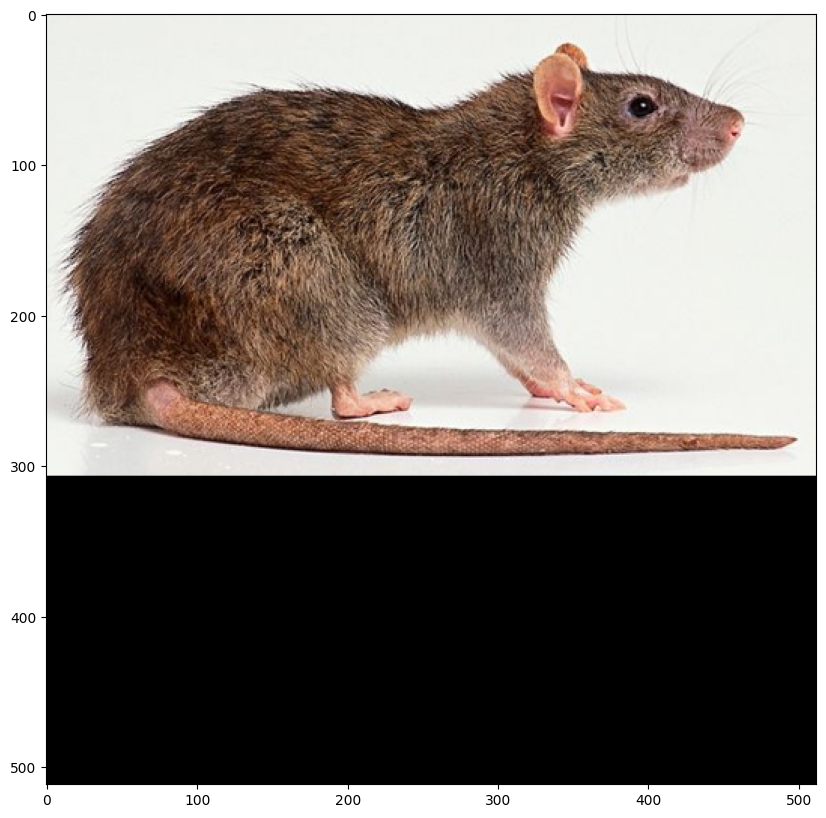

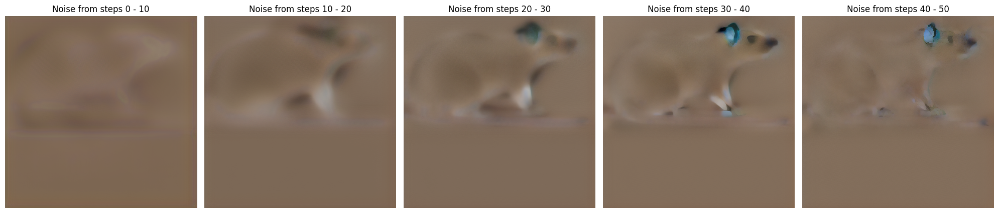

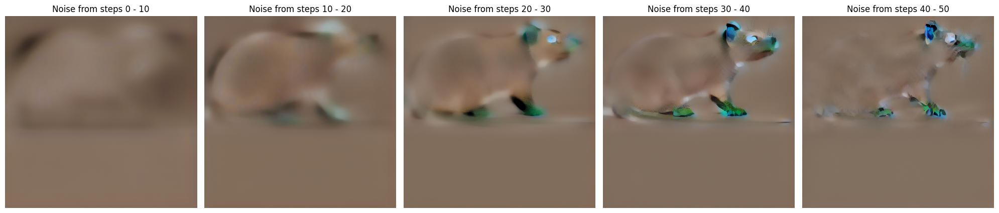

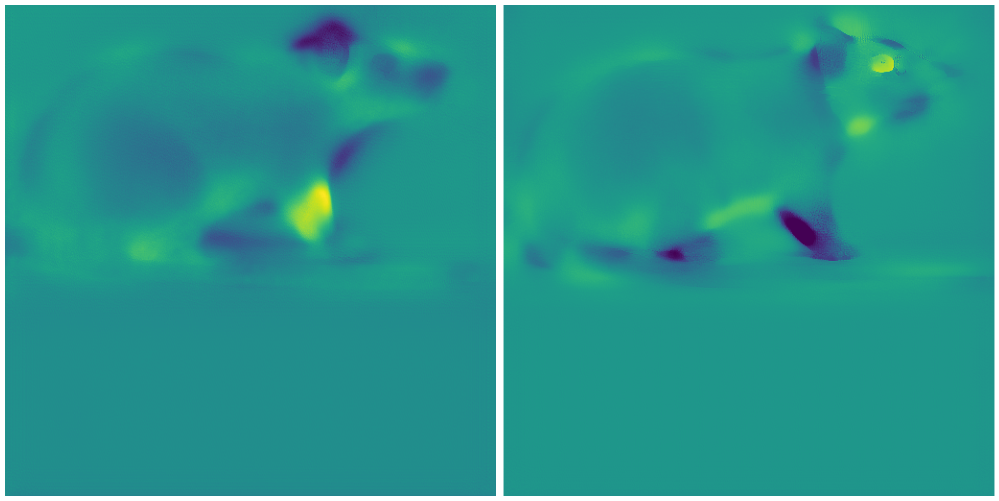

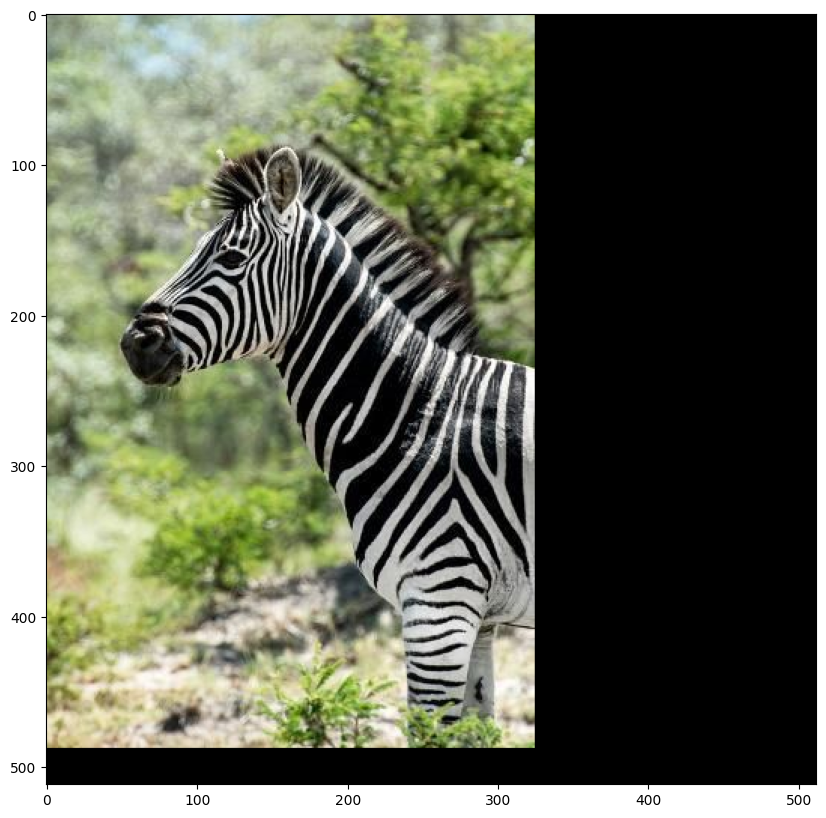

...

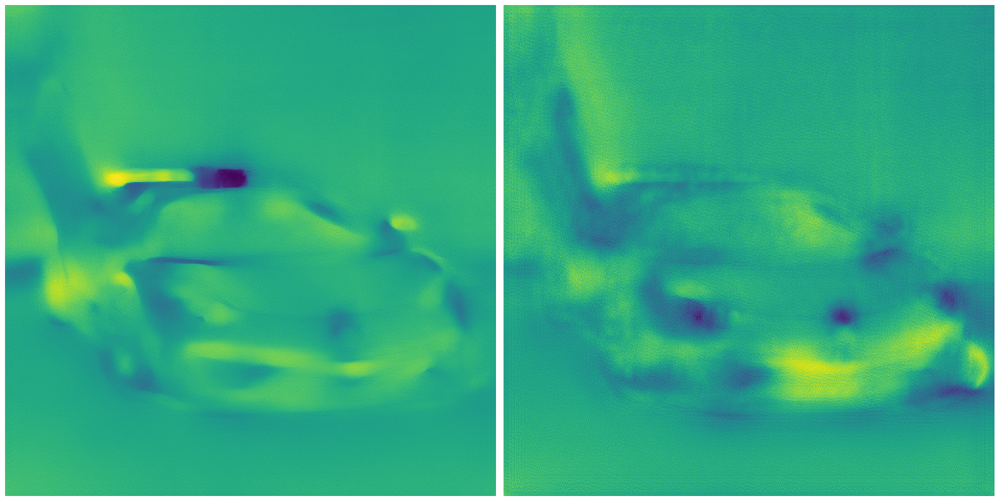

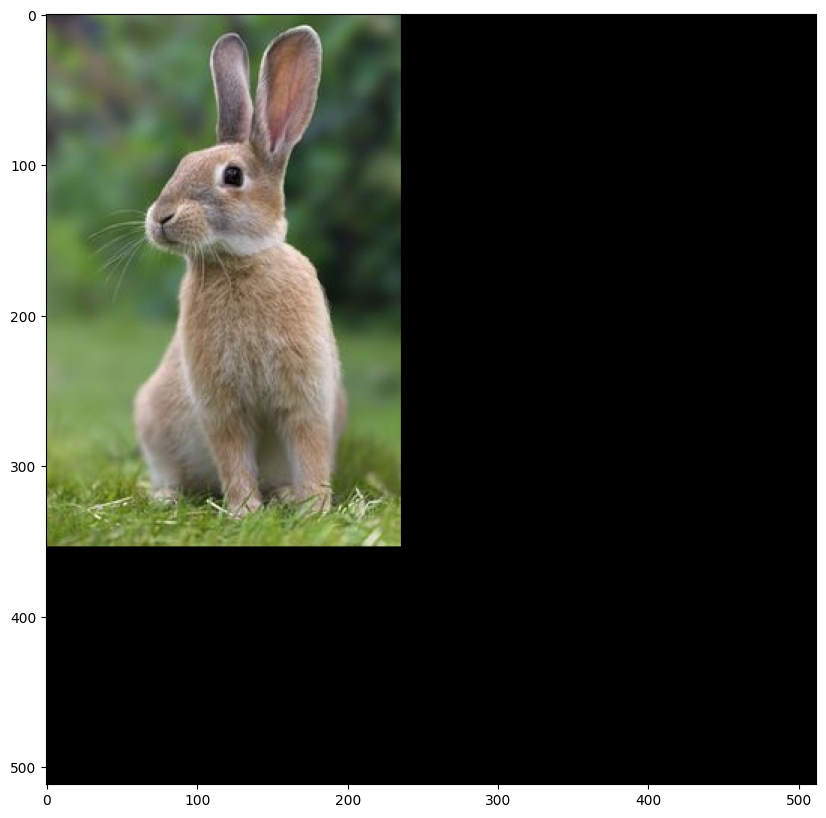

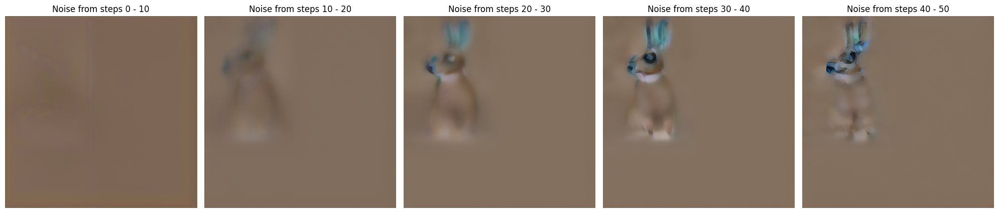

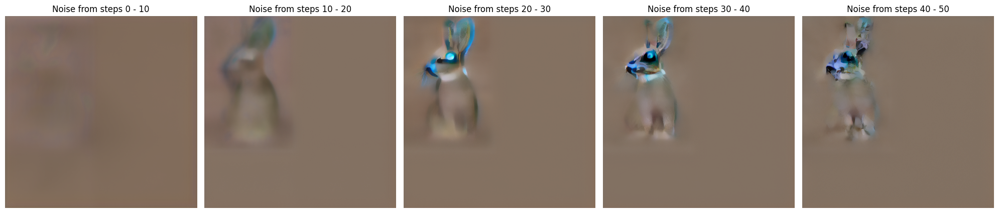

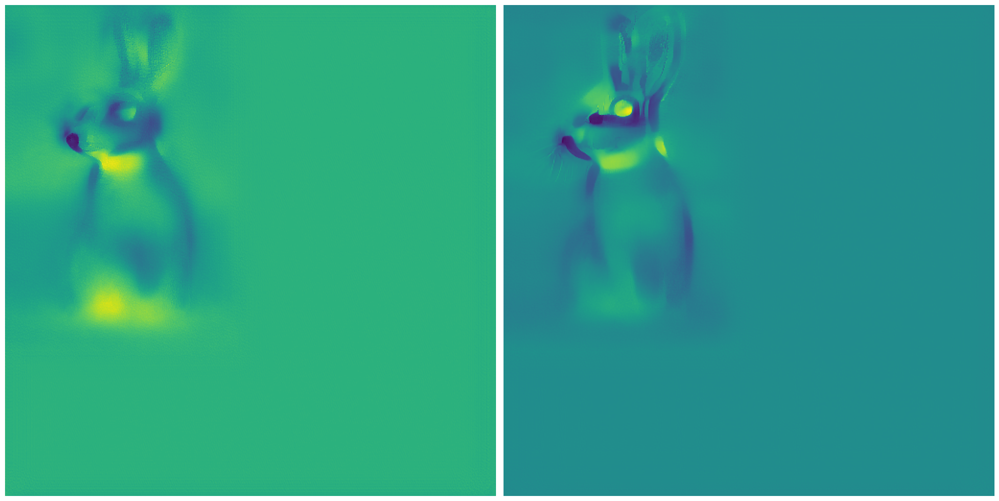

In [31]:
# Settings (same as before except for the new prompt)
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 8                  # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

def get_noise_preds(input_image, prompts):
    encoded = pil_to_latent(input_image)
    prompt, prompt_2 = prompts
    
    # Prep Scheduler (setting the number of inference steps)
    scheduler.set_timesteps(num_inference_steps)

    def add_noise(sampling_step):
        noise = torch.randn_like(encoded) # Random noise
        encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
        #latents_to_pil(encoded_and_noised.float())[0] # Display
        return encoded_and_noised

    noised_latents = [add_noise(step) for step in range(num_inference_steps)]

    # Prep text (same as before)
    text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

    text_input_2 = tokenizer([prompt_2], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
        text_embeddings_2 = text_encoder(text_input_2.input_ids.to(torch_device))[0]

    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 

    text_embeddings = torch.cat([uncond_embeddings, text_embeddings, text_embeddings_2])

    noise_preds = []
    noise_preds_2 = []
    noise_preds_uncond = []

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps)):
            latents = noised_latents[i].to(torch_device).float()
            # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
            latent_model_input = torch.cat([latents] * 3)
            latent_model_input = scheduler.scale_model_input(latent_model_input, t)

            # predict the noise residual
            with torch.no_grad():
                noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

            # perform guidance
            noise_pred_uncond, noise_pred_text, noise_pred_text_2  = noise_pred.chunk(3)
            #noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

            noise_preds.append(noise_pred_text)
            noise_preds_2.append(noise_pred_text_2)
            noise_preds_uncond.append(noise_pred_uncond)

            # compute the previous noisy sample x_t -> x_t-1
            #latents = scheduler.step(noise_pred, t, latents).prev_sample

    noise_preds = torch.cat(noise_preds, dim=0)
    noise_preds_2 = torch.cat(noise_preds_2, dim=0)
    noise_preds_uncond = torch.cat(noise_preds_uncond, dim=0)

    return noise_preds, noise_preds_2, noise_preds_uncond

def noise_image_sum(i, diffs, jump=10, heatmap=False):
    im = torch.sum(diffs[(i)*jump:(i+1)*jump], dim=0)
    # keep top 10% of values
    #im = im * (im > im.quantile(0.95))
    im = im.unsqueeze(0)

    im.shape
    im = latents_to_pil(im)[0]
    # turn Image into heatmap
    if heatmap:
        return im.convert('L')
    return im


def plot_merged_noise(noise_diff, jump=10, heatmap=False, caption=None):
    columns = noise_diff.shape[0] // jump
    fig, axs = plt.subplots(1, columns, figsize=(20, 20))
    # if caption:
    #     fig.suptitle(caption, fontsize=16)
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(noise_image_sum(i, noise_diff, jump=jump, heatmap=heatmap))
        ax.axis('off')
        ax.title.set_text(f"Noise from steps {i*jump} - {(i+1)*jump}")
    plt.tight_layout()


     
def plot_diffs(noise_preds, noise_preds_2, noise_preds_uncond, steps=(0,50)):
        noise_diff = noise_preds - noise_preds_2
        # take modulus of noise diff
        #noise_diff = torch.abs(noise_diff)
        # keep top and bottom 10% of values
        #noise_diff = noise_diff * (noise_diff > noise_diff.quantile(0.95))
        #noise_diff = noise_diff * (noise_diff < noise_diff.quantile(0.05))

        noise_diff_uncond = noise_preds - noise_preds_uncond
        
        plot_merged_noise(noise_diff, jump=10, heatmap=False, caption='Noise difference between prompts')
        plot_merged_noise(noise_diff_uncond, jump=10, heatmap=False, caption='Noise difference between prompt and unconditioned')
        
        fig, axs = plt.subplots(1, 2, figsize=(20, 20))
        imgs = [
            noise_image_sum(steps[0], noise_diff, steps[1], heatmap=True), 
            noise_image_sum(steps[0], noise_diff_uncond, steps[1], heatmap=True)
            ]
        for i, ax in enumerate(axs.flatten()):
            ax.imshow(imgs[i])
            ax.axis('off')
        plt.tight_layout()

import urllib
import os

for im, (url, prompts) in imgs.items():
    # if im does not exist, download it from url
    if not os.path.exists(im):
        urllib.request.urlretrieve(url, im)
    input_image = Image.open(im)
    input_image.thumbnail((width, height))
    input_image = input_image.crop((0, 0, width, height))
    noise_preds, noise_preds_2, noise_preds_uncond = get_noise_preds(input_image,prompts)
    # plot input image on new figure
    plt.figure(figsize=(10, 10))
    plt.imshow(input_image)
    plot_diffs(noise_preds, noise_preds_2, noise_preds_uncond, steps=(2,10))